In [1]:
import numpy as np
import pandas as pd
import cv2
from PIL import Image
from tqdm import tqdm

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Wed_Jul_22_19:09:09_PDT_2020
Cuda compilation tools, release 11.0, V11.0.221
Build cuda_11.0_bu.TC445_37.28845127_0


In [3]:
import matplotlib.pyplot as plt


In [115]:
def display_img(img,cmap=None):
  img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
  cv2_imshow(img)

In [5]:
import os

In [6]:
labelsPath = os.path.join("drive/MyDrive/CS2/yolo.names")
LABELS = open(labelsPath).read().strip().split("\n")

In [7]:
LABELS

['D10', 'D40', 'D00', 'D20', 'D44', 'D50']

In [177]:
weightsPath = os.path.join("drive/MyDrive/CS2/yolov3_custom_train_200.weights")
configPath = os.path.join("drive/MyDrive/CS2/yolov3_custom_test.cfg")

In [178]:
# Loading the neural network framework Darknet (YOLO was created based on this framework)
net = cv2.dnn.readNetFromDarknet(configPath,weightsPath)

In [185]:
#ref: https://github.com/quangnhat185/Machine_learning_projects/blob/master/Gun_detection_Yolov3/Yolov3_Gun_Detection.ipynb
# Create the function which predict the frame input
def predict(image):
    
    # initialize a list of colors to represent each possible class label
    np.random.seed(42)
    COLORS = np.random.randint(0, 255, size=(len(LABELS), 3), dtype="uint8")
    (H, W) = image.shape[:2]
    
    # determine only the "ouput" layers name which we need from YOLO
    ln = net.getLayerNames()
    ln = [ln[i[0] - 1] for i in net.getUnconnectedOutLayers()]
    
    # construct a blob from the input image and then perform a forward pass of the YOLO object detector, 
    # giving us our bounding boxes and associated probabilities
    blob = cv2.dnn.blobFromImage(image, 1 / 255.0, (416, 416), swapRB=True, crop=False)
    net.setInput(blob)
    layerOutputs = net.forward(ln)
    
    boxes = []
    confidences = []
    classIDs = []
    threshold = 0.25
    
    # loop over each of the layer outputs
    for output in layerOutputs:
        # loop over each of the detections
        for detection in output:
            #print('Ddetection : ', detection)
            # extract the class ID and confidence (i.e., probability) of
            # the current object detection
            scores = detection[5:]
            classID = np.argmax(scores)
            confidence = scores[classID]
            #print('Class ID {} has the highest score of {}'.format(classID, confidence))
            # filter out weak predictions by ensuring the detected
            # probability is greater than the minimum probability
            # confidence type=float, default=0.5
            if confidence > threshold:
                # scale the bounding box coordinates back relative to the
                # size of the image, keeping in mind that YOLO actually
                # returns the center (x, y)-coordinates of the bounding
                # box followed by the boxes' width and height
                box = detection[0:4] * np.array([W, H, W, H])
                (centerX, centerY, width, height) = box.astype("int")

                # use the center (x, y)-coordinates to derive the top and
                # and left corner of the bounding box
                x = int(centerX - (width / 2))
                y = int(centerY - (height / 2))

                if x<0:
                  x = 0
                if y<0:
                  y = 0

                # update our list of bounding box coordinates, confidences,
                # and class IDs
                boxes.append([x, y, int(width), int(height)])
                confidences.append(float(confidence))
                classIDs.append(classID)

    # apply non-maxima suppression to suppress weak, overlapping bounding boxes
    idxs = cv2.dnn.NMSBoxes(boxes, confidences, threshold, 0.1)

    # ensure at least one detection exists
    if len(idxs) > 0:
        # loop over the indexes we are keeping
        for i in idxs.flatten():
            # extract the bounding box coordinates
            (x, y) = (boxes[i][0], boxes[i][1])
            (w, h) = (boxes[i][2], boxes[i][3])

            # draw a bounding box rectangle and label on the image
            color = (255,0,0)
            cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
            text = "{}".format(LABELS[classIDs[i]], confidences[i])
            cv2.putText(image, text, (x +15, y + 20), cv2.FONT_HERSHEY_SIMPLEX,
                1, color, 2)
    return image

In [83]:
from google.colab.patches import cv2_imshow

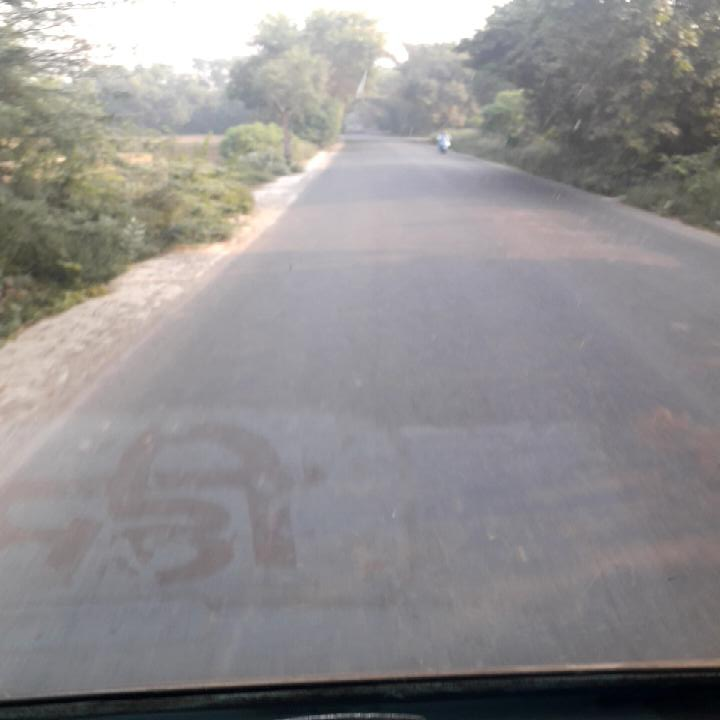

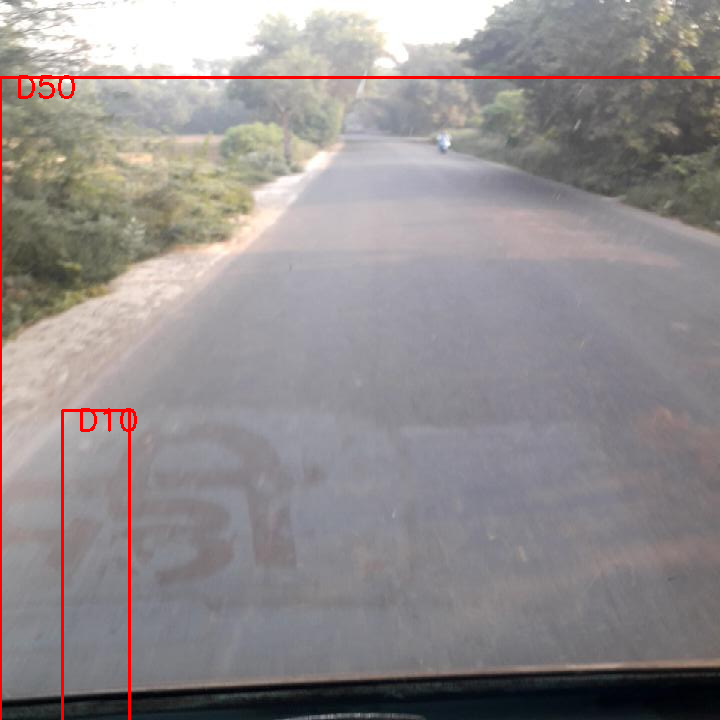

In [186]:
img = cv2.imread("drive/MyDrive/CS2/India_000025.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

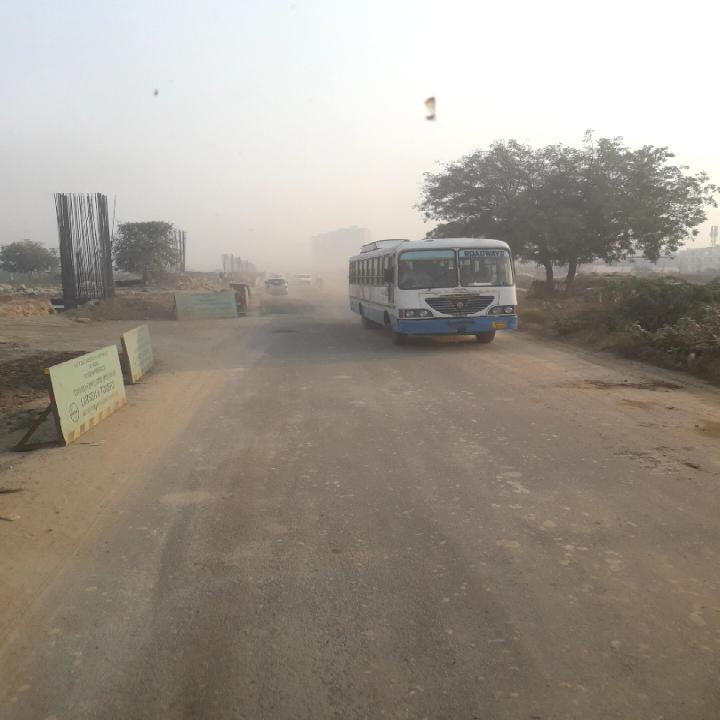

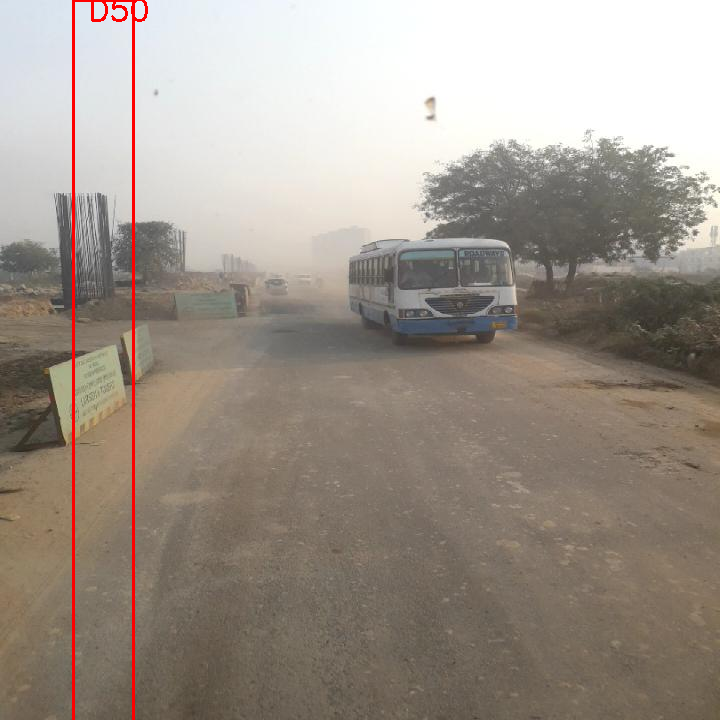

In [187]:

img = cv2.imread("drive/MyDrive/CS2/India_000029.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

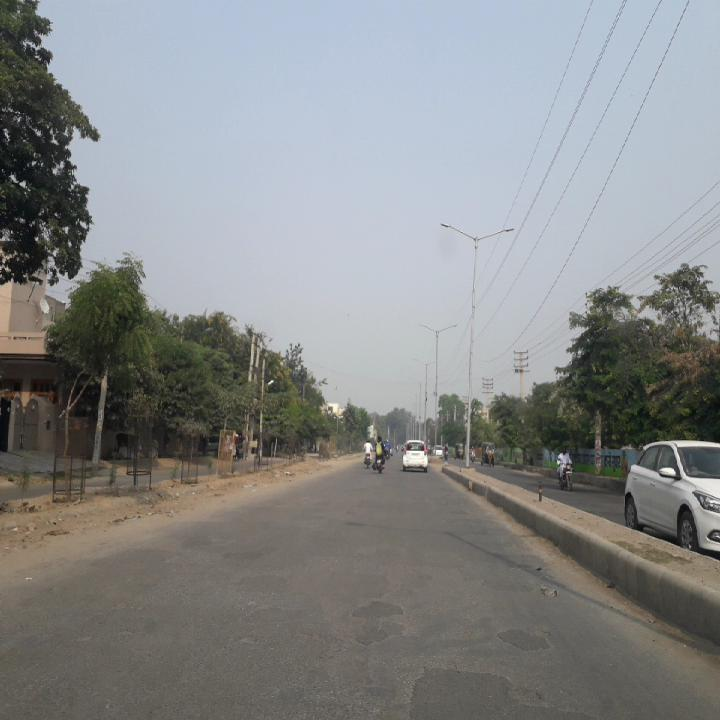

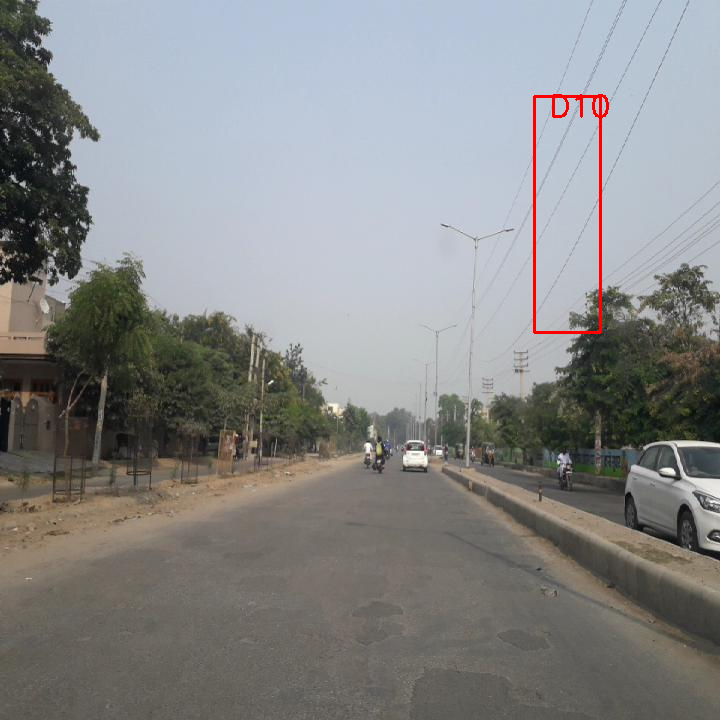

In [188]:
img = cv2.imread("drive/MyDrive/CS2/India_000100.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

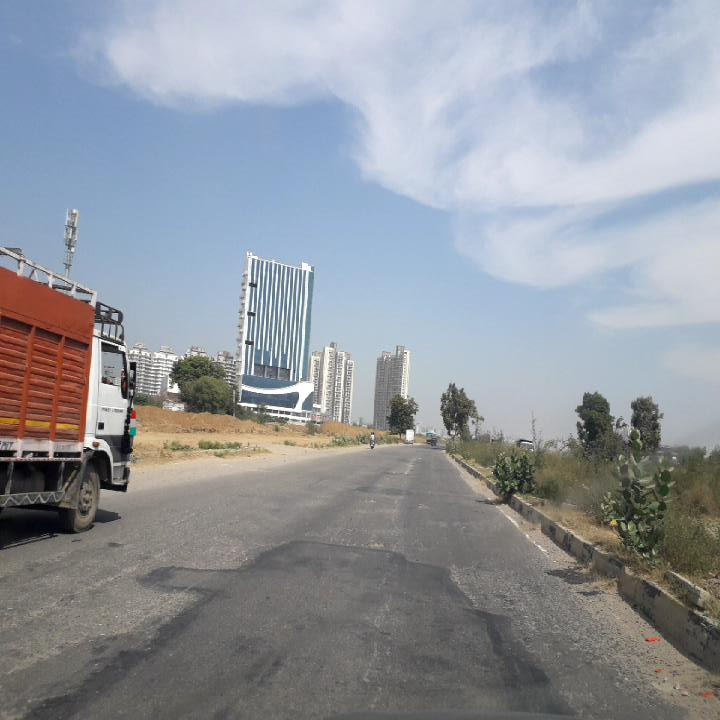

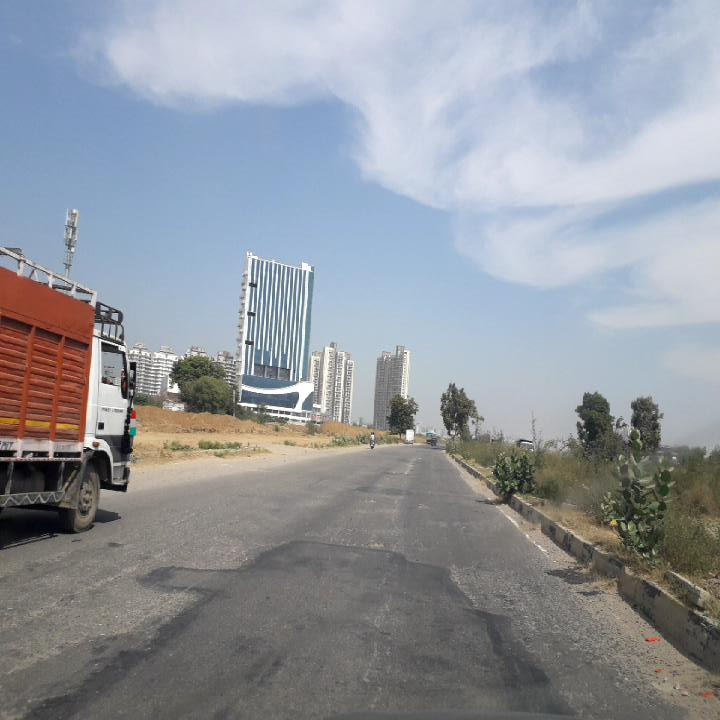

In [189]:
img = cv2.imread("drive/MyDrive/CS2/India_000246.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

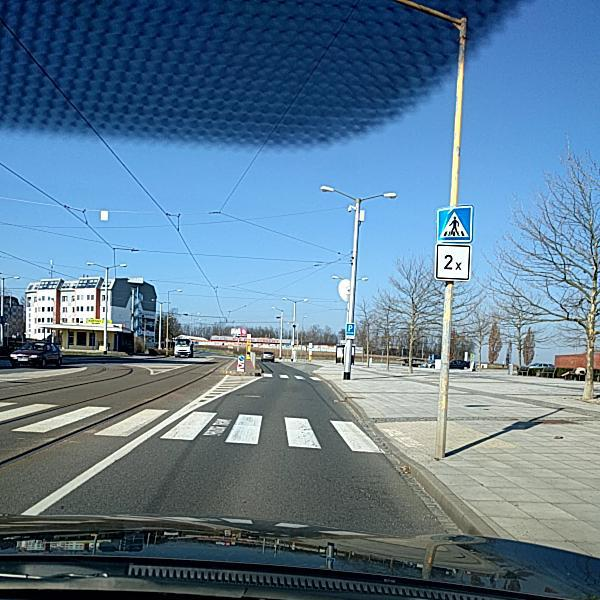

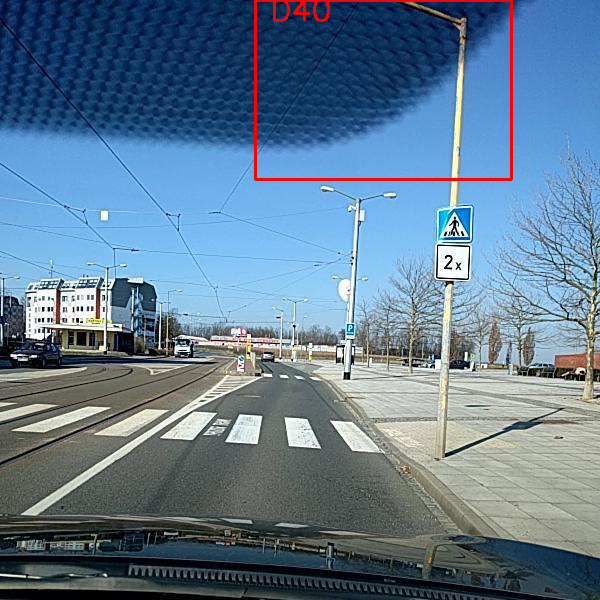

In [190]:
img = cv2.imread("drive/MyDrive/CS2/Czech_000390.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

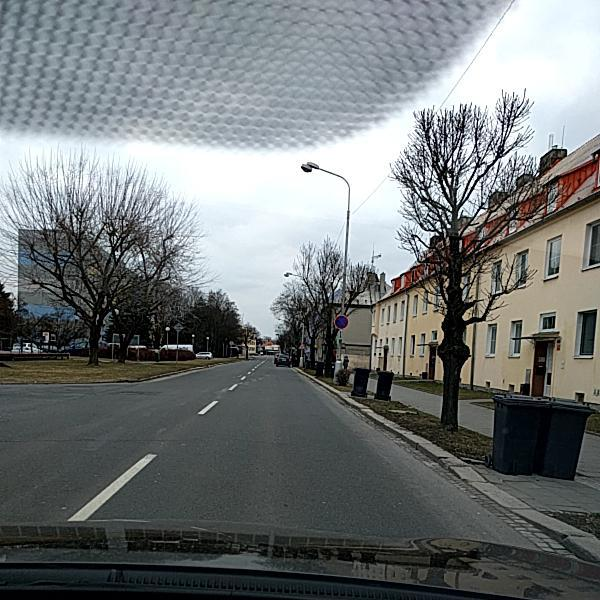

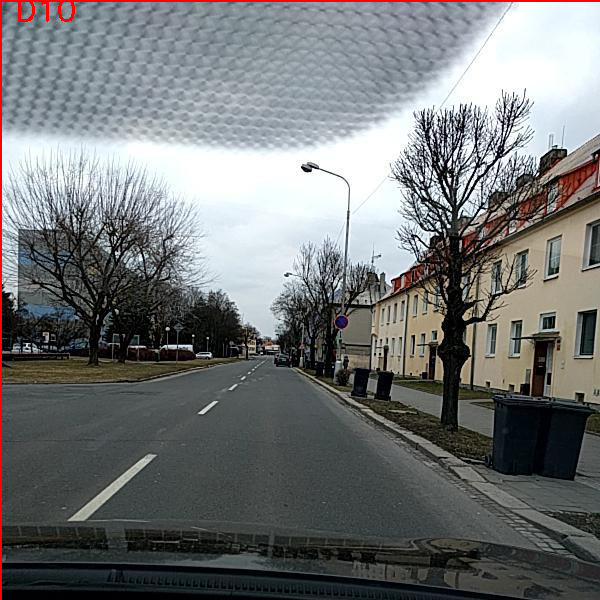

In [191]:
img = cv2.imread("drive/MyDrive/CS2/Czech_000094.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

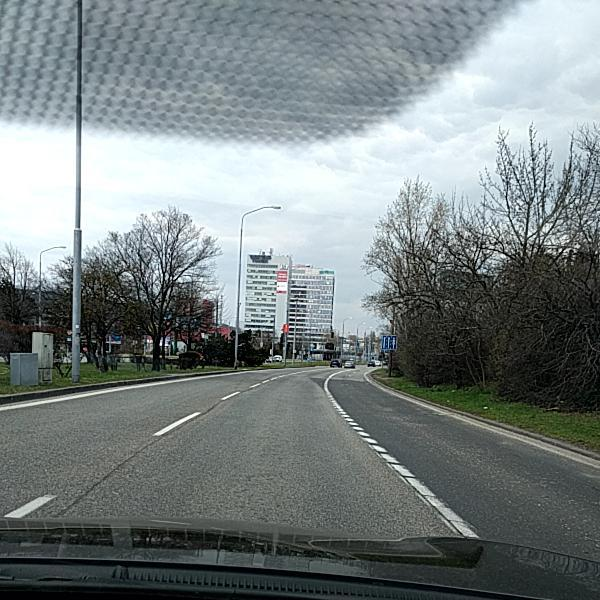

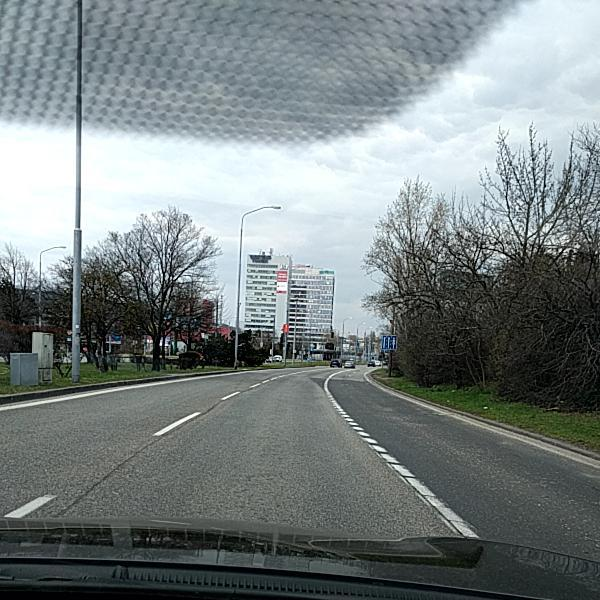

In [192]:
img = cv2.imread("drive/MyDrive/CS2/Czech_000004.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

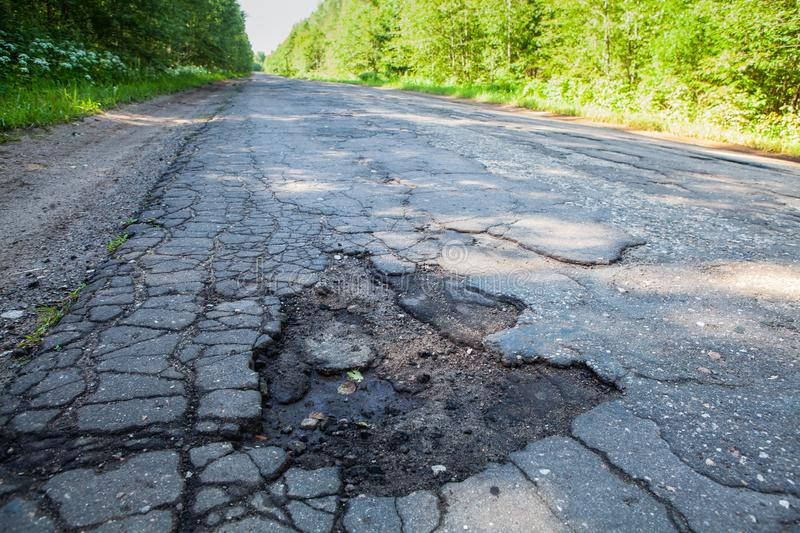

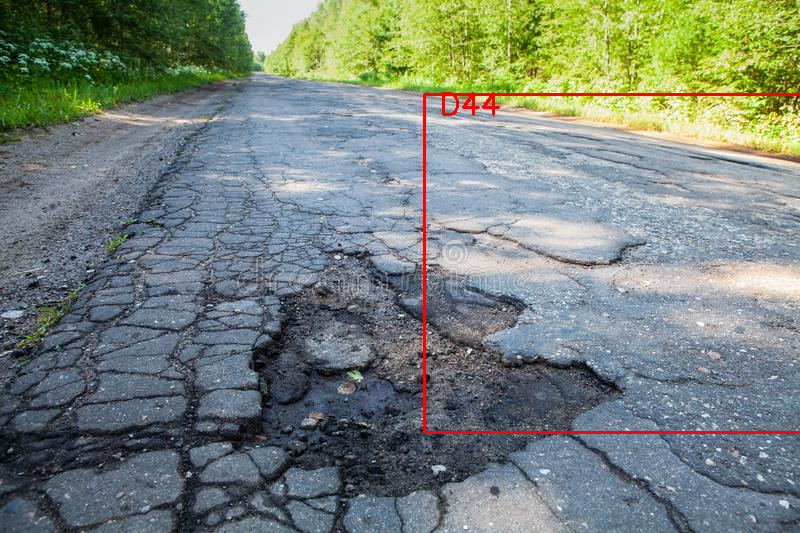

In [193]:
img = cv2.imread("drive/MyDrive/CS2/1.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

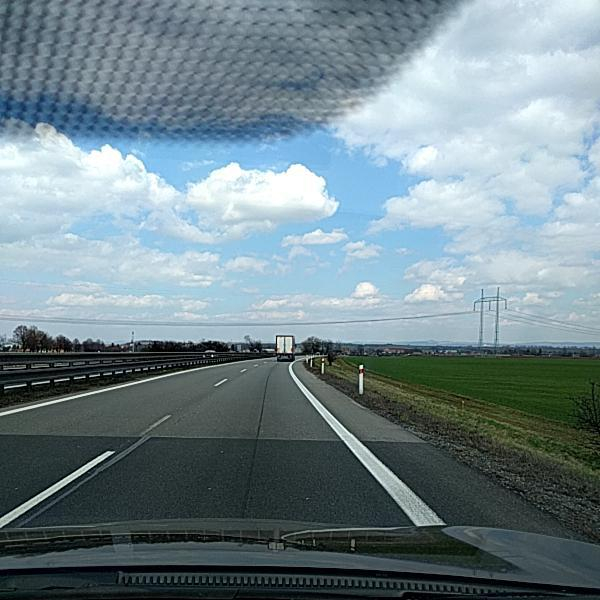

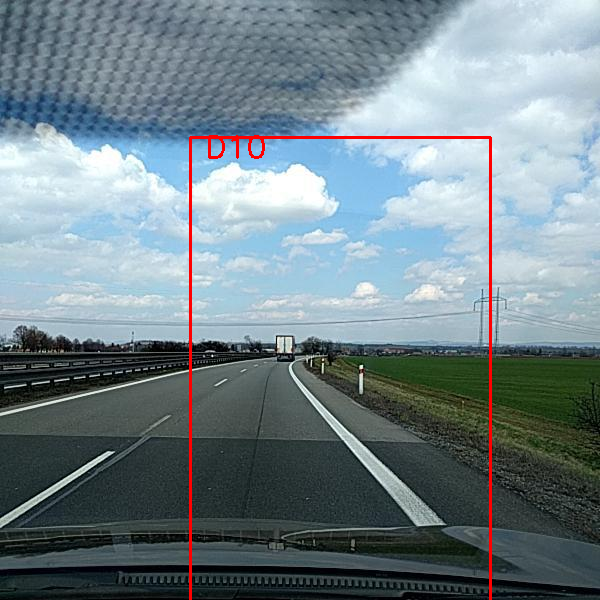

In [194]:
img = cv2.imread("drive/MyDrive/CS2/Czech_000026.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

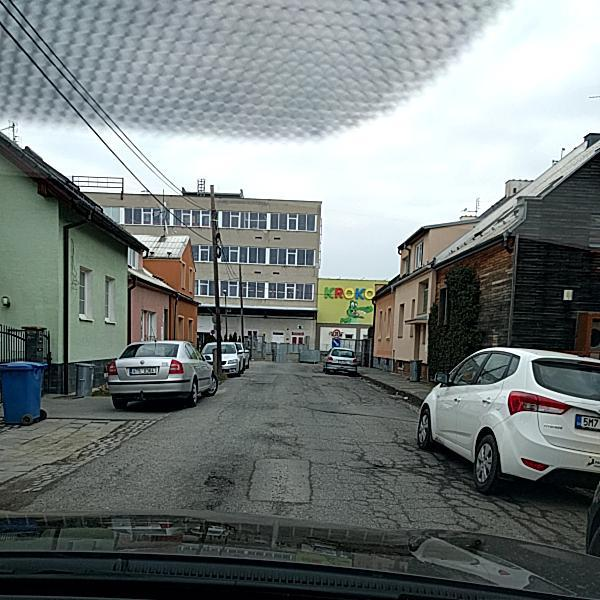

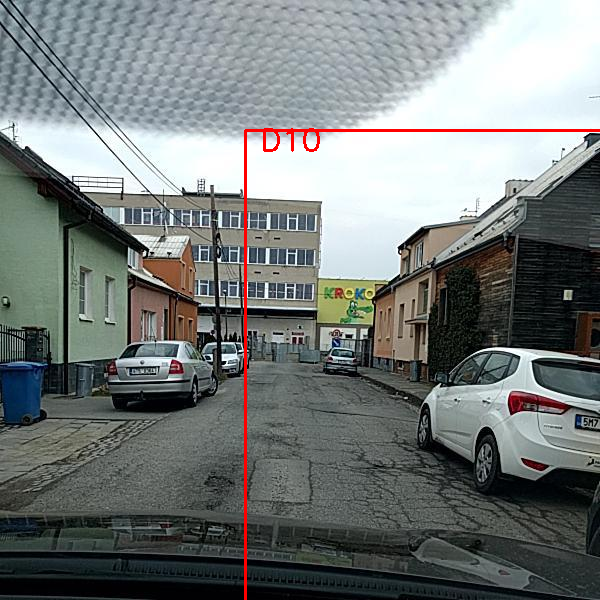

In [195]:
img = cv2.imread("drive/MyDrive/CS2/Czech_000396.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

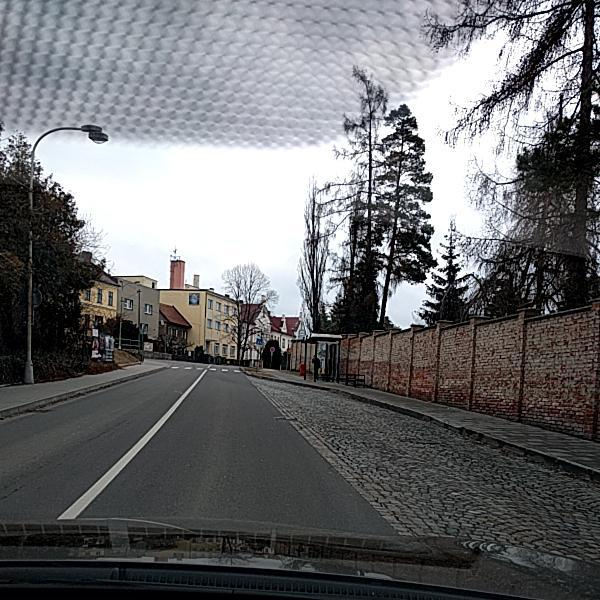

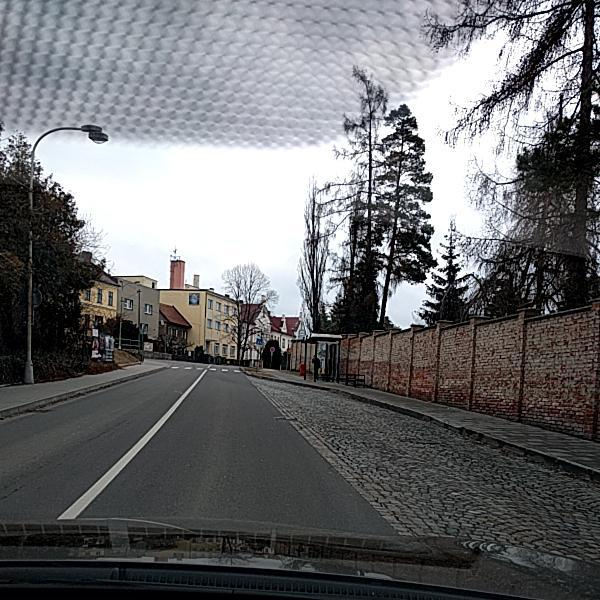

In [196]:
img = cv2.imread("drive/MyDrive/CS2/Czech_000672.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

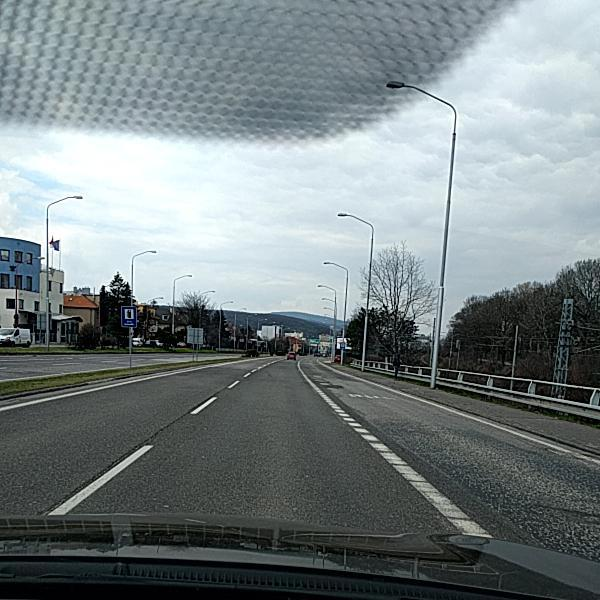

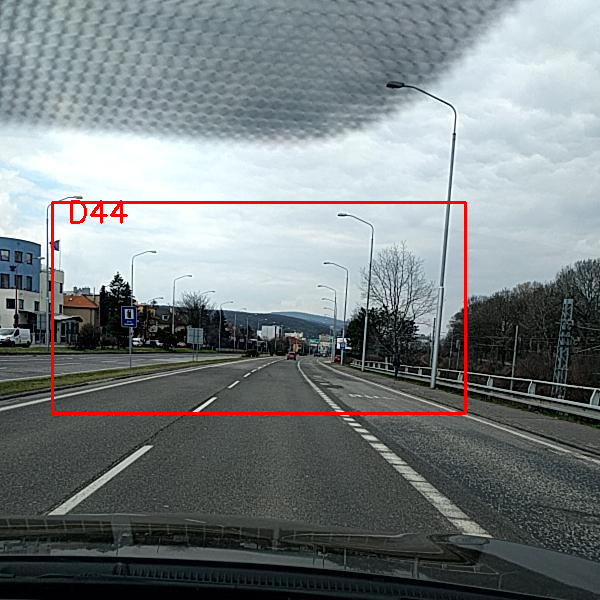

In [197]:
img = cv2.imread("drive/MyDrive/CS2/Czech_000717.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

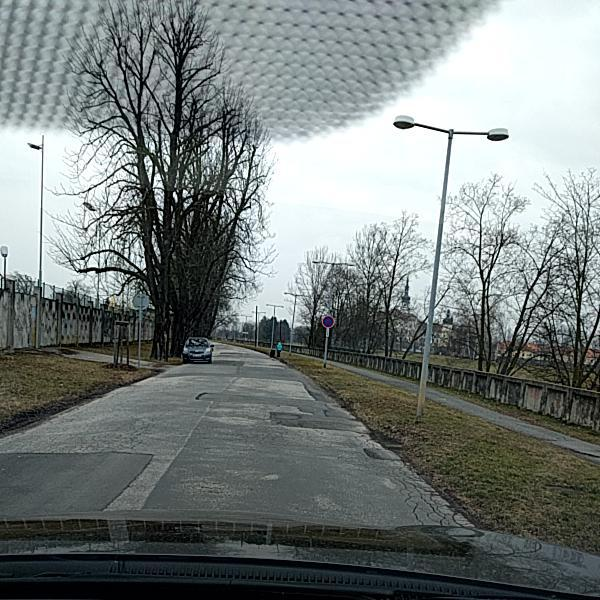

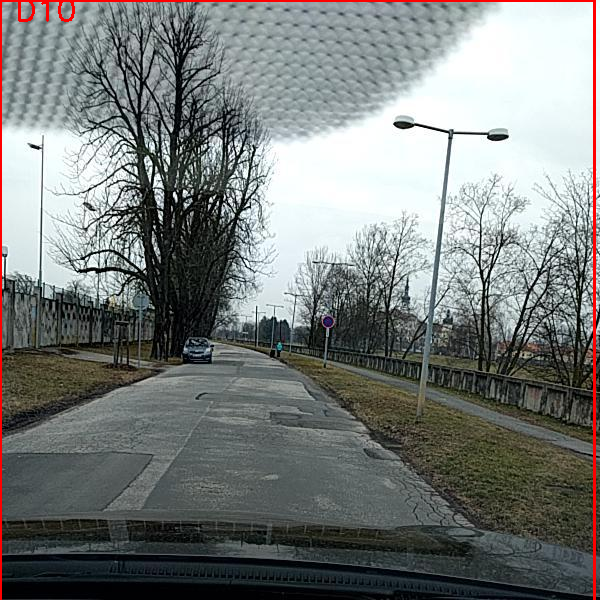

In [198]:
img = cv2.imread("drive/MyDrive/CS2/Czech_000972.jpg")
cv2_imshow(img)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(predict(img))

# **Observations:**
* Not good performance.
* Prediction on Czech Republic's road images is still better.
* saved Weight's of higher epochs doesn't give any predictions. 